# Compairing the deconvolved and the single view images in a different dataset

## 0. Imports

In [1]:
# --- PARAMETER SETTING ---
TP = 400
VIEW = '0'

In [2]:
from pathlib import Path
import napari 
import sys
import tifffile
from lineagetree import LineageTree, read_from_mastodon
import numpy as np
from skimage.measure import regionprops
import matplotlib.pyplot as plt
import h5py
from scipy.ndimage import gaussian_filter, median_filter, grey_erosion
from skimage.filters import threshold_otsu, threshold_multiotsu, sobel
from skimage.segmentation import watershed

# CUSTOM FUNCTIONS
from watermasks.utils import paths, import_registration_mats_multiview, registered_position_of_id_in_t, paint_annotations, view_overlays_3d_V2, block_timer
from watermasks.main import percentile_intensities_sampler, draw_sph_at_pos

## 1. Process the single view

In [3]:
path_h5, path_xml, path_mast, dir_input_images, dir_output_masks = paths('JR_22-11-17')

In [12]:
# LOAD THE IMAGE
with h5py.File(path_h5, "r") as f5:
    test_image = f5[f't00{TP}'][f's0{VIEW}']['2']['cells'][:]

# LOAD REG. MATRICES AND LINEAGETREE
R_of_t = import_registration_mats_multiview(path_xml, TP-5,TP+5)
lT = read_from_mastodon(path_mast);

shape_full_h5 = np.asarray([304, 1602, 2140]) # This is the h5 with the original images : view 0 and view 1
shape_test_image = np.array(np.shape(test_image))
scaling = shape_test_image/shape_full_h5
print(f'full image shape = {shape_full_h5}\n2nd h5 layer has shape = {shape_test_image} \n-scaling ratio is [z, y, x] = {scaling}')

# GET THE REGISTERED MASTODON POSITIONS
reg_pos_at_t = []
for mastodon_id_t in lT.time_nodes[TP]:
    x, y, z = registered_position_of_id_in_t(mastodon_id_t, lT, TP, R_of_t, VIEW, scaling, Transformations_In_Reverse=False)
    reg_pos_at_t.append([x, y, z])
reg_pos_at_t = np.asarray(reg_pos_at_t)

# --- VISUALIZE THE ANNOTATIONS ---
an_space = paint_annotations(TP, lT, shape_test_image, R_of_t, scaling, VIEW, 1, Transformations_In_Reverse=False)

{137115: array([], dtype=int32), 137114: array([], dtype=int32), 137113: array([], dtype=int32), 137112: array([], dtype=int32), 137111: array([], dtype=int32), 137110: array([], dtype=int32), 137109: array([], dtype=int32), 137108: array([], dtype=int32), 137107: array([], dtype=int32), 137106: array([], dtype=int32), 137105: array([], dtype=int32), 137104: array([], dtype=int32), 137103: array([], dtype=int32), 137102: array([], dtype=int32), 137101: array([], dtype=int32), 137100: array([], dtype=int32), 137099: array([], dtype=int32), 137098: array([], dtype=int32), 137097: array([], dtype=int32), 137096: array([], dtype=int32), 137095: array([], dtype=int32), 137094: array([], dtype=int32), 137093: array([], dtype=int32), 137092: array([], dtype=int32), 137091: array([], dtype=int32), 137090: array([], dtype=int32), 137089: array([], dtype=int32), 137088: array([], dtype=int32), 137087: array([], dtype=int32), 137086: array([], dtype=int32), 137085: array([], dtype=int32), 137084:

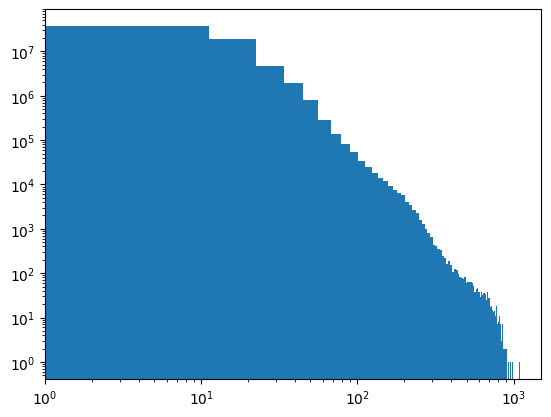

In [22]:
plt.hist(test_image.ravel(), bins=100)
plt.xlim(1,1500)
plt.xscale('log')
plt.yscale('log')

In [25]:
# --- COMPUTE PARAMETERS ---
INTENSITY_FLOOR = np.percentile(test_image, 30)
INTENSITY_CUTOFF = np.percentile(test_image, 99.99)
EROSION_RADIUS = 7

print(f' Intensity floor ={INTENSITY_FLOOR} intensity ceiling = {INTENSITY_CUTOFF}')

 Intensity floor =2.0 intensity ceiling = 272.0


In [26]:
# --- IMAGE PRE-PROCESSING ---
im = test_image
pos_array = np.array([p[::-1] for p in reg_pos_at_t]).round().astype(np.uint16)
im_gauss = gaussian_filter(im, sigma=1)
im_gauss_median = median_filter(im_gauss, size=1) # this seems that is not doing much! (inspection by eye)

erosion = grey_erosion(im_gauss_median, size=EROSION_RADIUS)
im_for_ws = im_gauss_median - erosion
im_ws_gauss = gaussian_filter(im_for_ws, sigma = 1)

# CREATE THE FIRST IGNORE MASK
ignore_mask = []
ignore_mask = im_gauss_median < INTENSITY_FLOOR

In [28]:
# --- MAIN LOOP ---
starting_min_intensity=500 # min intensity value a the beggining of the loop
min_mask_floor_limit=10 # intensity is never accepted bellow this value
percent_of_th=100
min_th_vol=300
max_th_vol=1500
total_steps=10

pos_array = np.array([p[::-1] for p in reg_pos_at_t]).round().astype(np.uint16)
seeds = np.zeros_like(im)
seeds[tuple(pos_array.T)] = np.arange(1, len(reg_pos_at_t) + 1)
all_seeds = set(np.unique(seeds)) - {0}

vols = {}
# Remove bad initialization

def get_mask(current_min_intensity, global_min_intensity_):
    thresh_val = max(current_min_intensity, global_min_intensity_)
    return thresh_val, (im_for_ws > thresh_val) & (~ignore_mask) # returns True at positions where intensity is greater than the threshhold, if pixel should not be ignored according to original ignore_mask.

# FIRST WATERSHED, STARTING WITH 
ws = watershed(np.max(im_ws_gauss) - im_ws_gauss, seeds, mask=get_mask(starting_min_intensity, starting_min_intensity)[1])
print(f"First applied thershold = {starting_min_intensity}")

# FIRST FILTERING
# Yes, it could be part of the main while loop.
unique, counts = np.unique_counts(ws)
vols = dict(zip(unique, counts))
for s, v in vols.items():
    if s != 0 and (v < min_th_vol or v > max_th_vol): # don't check the background
        ws[ws == s] = 0
ws0 = ws.copy()
# Visualize the initial, segmentation, OLNLY FOR TESTING

missed_seeds = all_seeds - set(np.unique(ws))

found_seeds = {}
pct1 = 100
found_seeds[pct1] = len(all_seeds - missed_seeds)
print("- starting missing:", len(missed_seeds))

inc = 1 # for visualization reasons
intensities_samples = percentile_intensities_sampler(im_ws_gauss, intensity_thresh_range=[min_mask_floor_limit, starting_min_intensity], print_thresholds=True)
for pct, current_threshold in intensities_samples.items():
    with block_timer(): # Toggle it if you want to time each interation
        if not missed_seeds:
            break
        
        current_thresh, mask = get_mask(current_threshold, min_mask_floor_limit) #  Lowest intensity is dectated by the intensities partitions
        new_ws = watershed(np.max(im_for_ws) - im_for_ws, seeds, mask=mask)
        print(f"*Applied thershold = {current_threshold} @ {pct}%")

        unique, counts = np.unique_counts(new_ws)
        vols = dict(zip(unique, counts))

        for s in missed_seeds.intersection(vols.keys()):
            if s != 0 and min_th_vol < vols[s] < max_th_vol:
                ws[new_ws == s] = s

        if inc == 2:
            ws1 = ws.copy()
            # Visualize the 2nd interation of th segmentation image, OLNY FOR TESTING

        missed1 = len(missed_seeds)
        missed_seeds = all_seeds - set(np.unique(ws))
        missed2 = len(missed_seeds)
        found_seeds[pct] = missed1 - missed2
        print("-- missing:", len(missed_seeds))
        inc+=1

First applied thershold = 500
- starting missing: 291
99.99%      ---->      445.0
99.9%      ---->      257.0
99%      ---->      130.0
97%      ---->      88.0
95%      ---->      69.0
92%      ---->      53.0
90%      ---->      47.0
80%      ---->      30.0
50%      ---->      17.0
30%      ---->      13.0
10%      ---->      11.0
*Applied thershold = 445.0 @ 99.99%
-- missing: 291
-(Time elapsed: 3.729977 s)

*Applied thershold = 257.0 @ 99.9%
-- missing: 288
-(Time elapsed: 3.858440 s)

*Applied thershold = 130.0 @ 99%
-- missing: 271
-(Time elapsed: 4.677033 s)

*Applied thershold = 88.0 @ 97%
-- missing: 218
-(Time elapsed: 6.328383 s)

*Applied thershold = 69.0 @ 95%
-- missing: 164
-(Time elapsed: 6.353599 s)

*Applied thershold = 53.0 @ 92%
-- missing: 112
-(Time elapsed: 6.641733 s)

*Applied thershold = 47.0 @ 90%
-- missing: 88
-(Time elapsed: 4.944541 s)

*Applied thershold = 30.0 @ 80%
-- missing: 59
-(Time elapsed: 5.159248 s)

*Applied thershold = 17.0 @ 50%
-- missin

In [29]:
l_tot=len(lT.time_nodes[TP])
l_missed = len(missed_seeds)
sig=3
print(f'out of {l_tot} annotations, missed {l_missed}({l_missed/l_tot*100:.3g}%)')

out of 291 annotations, missed 29(9.97%)


In [30]:
radius = (3*min_th_vol/(4*np.pi))**(1/3) # the sphere will have the minimum allowed volume
for ms in missed_seeds:
    pos_ms = np.asarray(np.where(seeds == ms)).T.ravel()
    print(pos_ms)
    x, y, z = np.ogrid[:shape_test_image[0], :shape_test_image[1], :shape_test_image[2]]

    ms_mask = (z-pos_ms[2])**2 + (y-pos_ms[1])**2 + (x-pos_ms[0])**2 <= radius**2 

    ws[ms_mask] = ms

[202 203 142]
[209 210 158]
[215 275 169]
[219 187 403]
[115 361 218]
[ 55 281 363]
[ 43 162 296]
[ 38 206 303]
[ 37 231 302]
[ 41 221 336]
[ 40 237 248]
[ 42 256 250]
[ 42 197 344]
[ 47 219 361]
[ 50 178 328]
[ 53 191 217]
[107 199 109]
[100 181 120]
[160 148 159]
[ 68 254 369]
[156 157 123]
[ 59 238 382]
[188 148 185]
[223 182 196]
[139  72 301]
[ 40 284 259]
[123  68 327]
[ 53 182 246]
[ 81 315 297]


In [32]:
viewer = napari.Viewer()
viewer.add_image(im_ws_gauss)
viewer.add_image(an_space, colormap='green')
viewer.add_labels(ws)
napari.run()

### Discussion

We get decent results for new datasets with almost no furter parameter tweaking (maybe the image preprocessing stages could be calibrated)

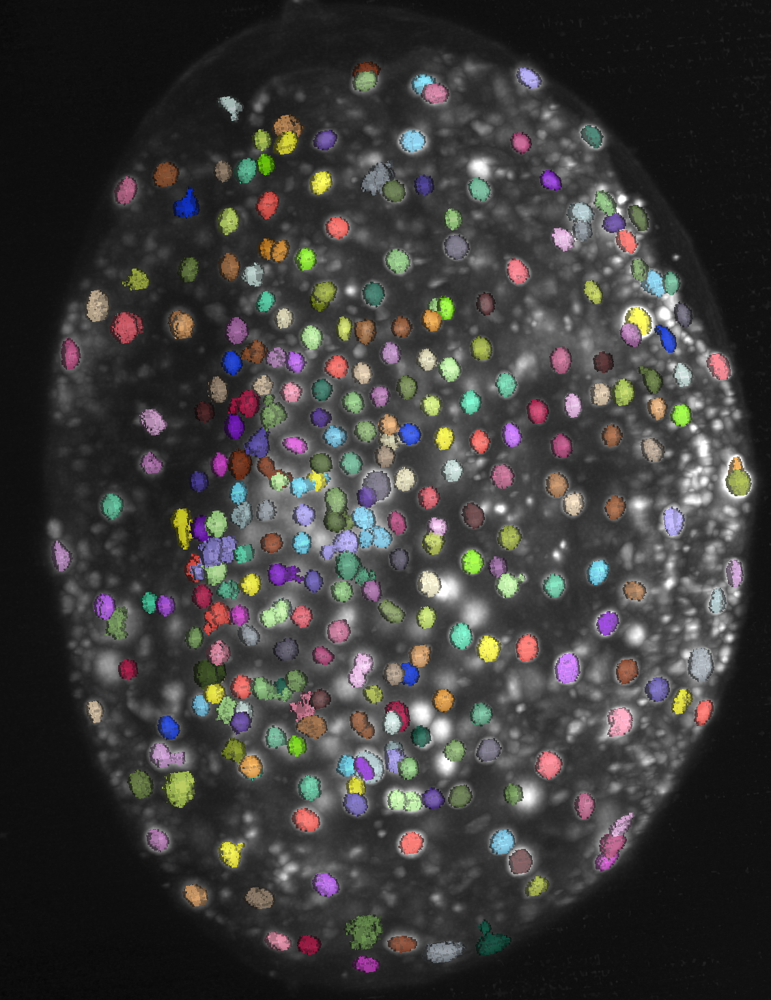

## 2. Process the deconvloved image

## 3. Visually compair resutls